In [1]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread("bougainvilla.png")

print("Image loaded:", img is not None)
print("Shape:", img.shape)

Image loaded: True
Shape: (549, 970, 3)


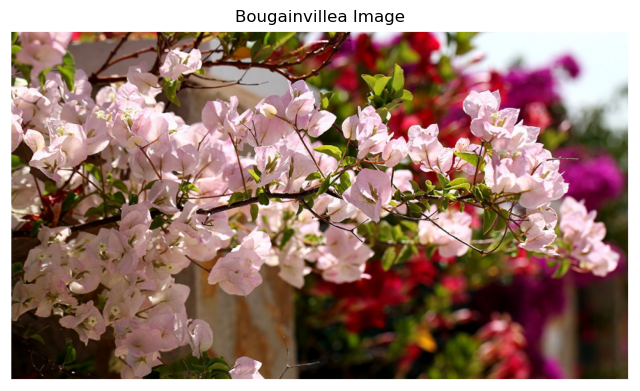

In [2]:
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(8, 6))
plt.imshow(img_rgb)
plt.title("Bougainvillea Image")
plt.axis("off")
plt.show()

Image loaded successfully!
Image shape: (549, 970, 3)
Grayscale shape: (549, 970)


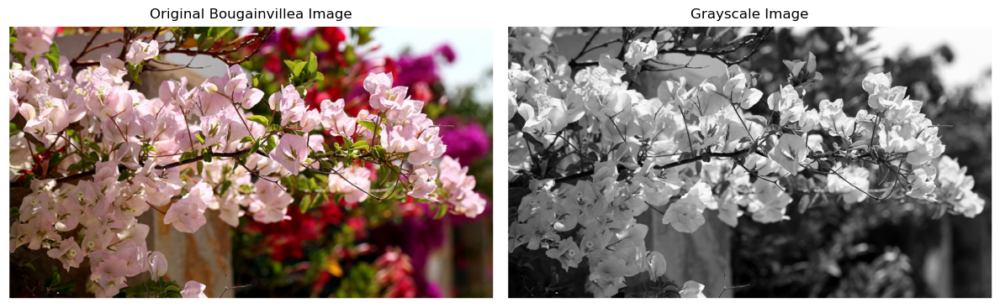

In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2

# -------------------------------
# Load your Bougainvillea image
# -------------------------------

image_path = "bougainvilla.png"

img_bgr = cv2.imread(image_path)

if img_bgr is None:
    raise FileNotFoundError(f"Could not find {image_path}")

# Convert BGR to RGB
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Grayscale image
gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

print("Image loaded successfully!")
print("Image shape:", img_rgb.shape)
print("Grayscale shape:", gray.shape)


# -------------------------------
# Function to display images
# -------------------------------

def show_images(images, titles, cols=3, cmap=None, figsize=(15, 8)):
    rows = int(np.ceil(len(images) / cols))
    plt.figure(figsize=figsize)

    for i, (im, title) in enumerate(zip(images, titles), 1):
        plt.subplot(rows, cols, i)

        if im.ndim == 2:
            plt.imshow(im, cmap=cmap or 'gray')
        else:
            plt.imshow(im)

        plt.title(title)
        plt.axis('off')

    plt.tight_layout()
    plt.show()


# -------------------------------
# Function to normalize values
# -------------------------------

def norm_u8(x):
    x = np.asarray(x, dtype=np.float32)

    mn, mx = np.nanmin(x), np.nanmax(x)

    if mx <= mn:
        return np.zeros_like(x, dtype=np.uint8)

    return np.clip(
        (x - mn) / (mx - mn) * 255,
        0,
        255
    ).astype(np.uint8)


# -------------------------------
# Display original and grayscale
# -------------------------------

show_images(
    [img_rgb, gray],
    ["Original Bougainvillea Image", "Grayscale Image"],
    cols=2,
    figsize=(12, 6)
)

Edge pixels: 56817
Detected corners: 120


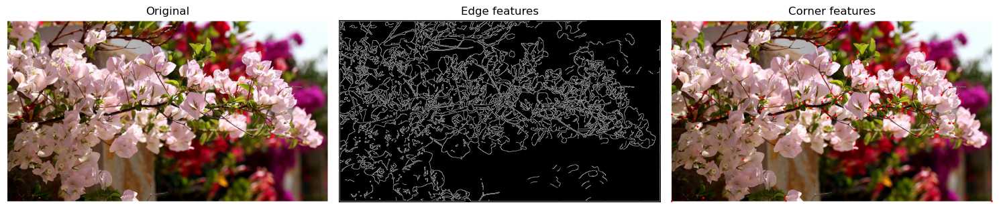

In [4]:
edges_basic = cv2.Canny(gray, 80, 160)

corners = cv2.goodFeaturesToTrack(
    gray,
    maxCorners=120,
    qualityLevel=0.01,
    minDistance=8
)

corner_img = img_rgb.copy()

if corners is not None:
    for c in np.int32(corners).reshape(-1, 2):
        cv2.circle(corner_img, tuple(c), 3, (255, 0, 0), -1)

print('Edge pixels:', np.count_nonzero(edges_basic))
print('Detected corners:', 0 if corners is None else len(corners))

show_images(
    [img_rgb, edges_basic, corner_img],
    ['Original', 'Edge features', 'Corner features']
)

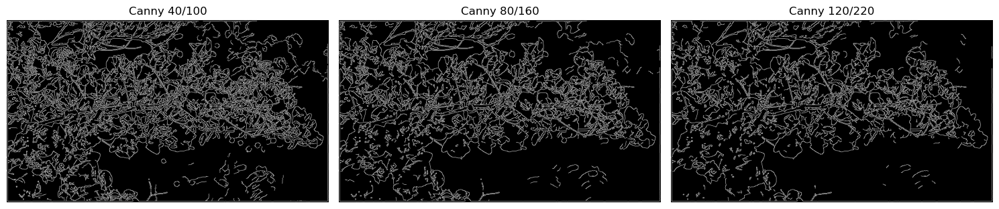

Observation: lower thresholds usually retain more weak texture edges; higher thresholds keep fewer, stronger boundaries.


In [5]:
canny_1 = cv2.Canny(gray, 40, 100)
canny_2 = cv2.Canny(gray, 80, 160)
canny_3 = cv2.Canny(gray, 120, 220)

show_images(
    [canny_1, canny_2, canny_3],
    ['Canny 40/100', 'Canny 80/160', 'Canny 120/220']
)

print('Observation: lower thresholds usually retain more weak texture edges; higher thresholds keep fewer, stronger boundaries.')

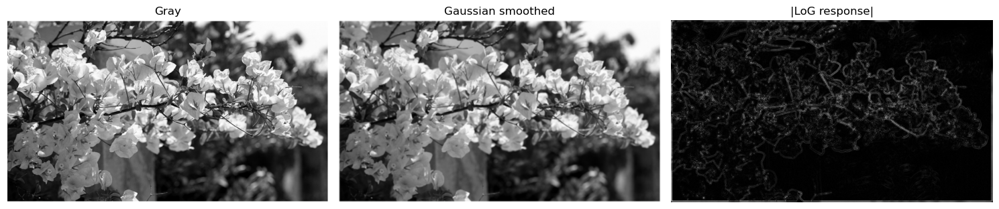

In [6]:
blurred = cv2.GaussianBlur(gray, (5,5), 1.2)
log_signed = cv2.Laplacian(blurred, cv2.CV_32F, ksize=3)
log_vis = norm_u8(np.abs(log_signed))
show_images([gray, blurred, log_vis], ['Gray','Gaussian smoothed','|LoG response|'])

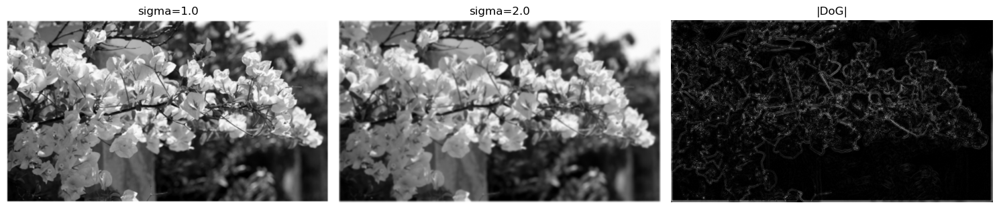

In [7]:
g1 = cv2.GaussianBlur(gray, (0,0), 1.0)
g2 = cv2.GaussianBlur(gray, (0,0), 2.0)
dog_signed = g1.astype(np.float32) - g2.astype(np.float32)
dog_vis = norm_u8(np.abs(dog_signed))
show_images([g1,g2,dog_vis], ['sigma=1.0','sigma=2.0','|DoG|'])

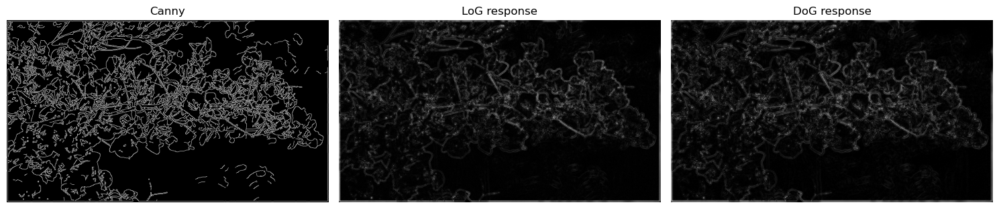

In [8]:
show_images([canny_2, log_vis, dog_vis], ['Canny','LoG response','DoG response'])

Detected line segments: 1255


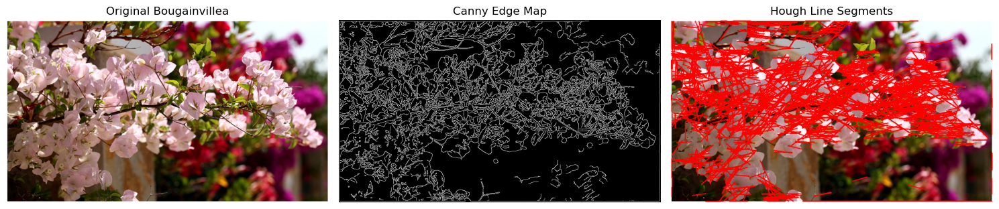

In [12]:
# Canny edge detection
edges_hough = cv2.Canny(gray, 40, 120)

# Detect line segments
lines = cv2.HoughLinesP(
    edges_hough,
    1,
    np.pi / 180,
    threshold=25,
    minLineLength=40,
    maxLineGap=12
)

hough_img = img_rgb.copy()
count = 0

if lines is not None:

    # Convert whatever shape OpenCV gives us into
    # rows of [x1, y1, x2, y2]
    lines = np.array(lines).reshape(-1, 4)

    for x1, y1, x2, y2 in lines:

        cv2.line(
            hough_img,
            (int(x1), int(y1)),
            (int(x2), int(y2)),
            (255, 0, 0),
            2
        )

        count += 1

print("Detected line segments:", count)

show_images(
    [img_rgb, edges_hough, hough_img],
    ["Original Bougainvillea", "Canny Edge Map", "Hough Line Segments"],
    cols=3,
    figsize=(15, 5)
)

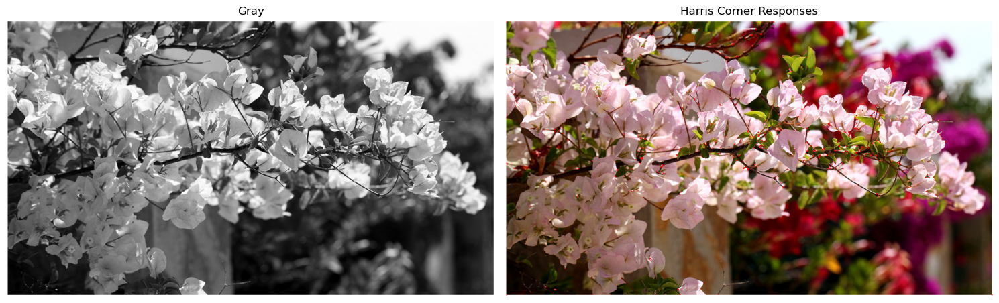

In [13]:
R = cv2.cornerHarris(
    np.float32(gray),
    blockSize=2,
    ksize=3,
    k=0.04
)

harris_img = img_rgb.copy()

harris_img[R > 0.01 * R.max()] = [255, 0, 0]

show_images(
    [gray, harris_img],
    ['Gray', 'Harris Corner Responses'],
    cols=2
)

In [17]:
%pip install scikit-image

Note: you may need to restart the kernel to use updated packages.


In [18]:
from skimage.feature import blob_doh

In [2]:
from skimage.feature import blob_doh

print("blob_doh is ready!")

blob_doh is ready!


In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image_path = "bougainvilla.png"

img_bgr = cv2.imread(image_path)

if img_bgr is None:
    raise FileNotFoundError("bougainvilla.png not found")

img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
gray_float = gray.astype(np.float32) / 255.0

print("Image loaded:", img_rgb.shape)

Image loaded: (549, 970, 3)


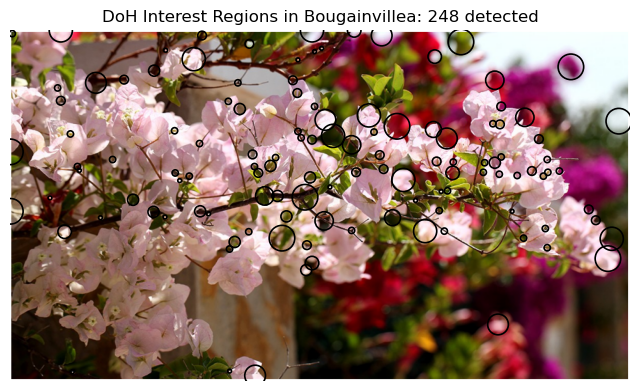

Image shape: (549, 970, 3)
Total blobs detected: 248


In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import blob_doh

# Load your image
image_path = "bougainvilla.png"

img_bgr = cv2.imread(image_path)

if img_bgr is None:
    raise FileNotFoundError("bougainvilla.png not found")

# Convert image
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
gray_float = gray.astype(np.float32) / 255.0

# DoH blob detection
blobs = blob_doh(
    gray_float,
    min_sigma=3,
    max_sigma=20,
    num_sigma=10,
    threshold=0.008
)

# Display results
fig, ax = plt.subplots(figsize=(8, 6))
ax.imshow(img_rgb)

for y, x, s in blobs[:120]:
    ax.add_patch(
        plt.Circle(
            (x, y),
            s,
            fill=False,
            linewidth=1.2
        )
    )

ax.set_title(
    f"DoH Interest Regions in Bougainvillea: {len(blobs)} detected"
)

ax.axis("off")
plt.show()

print("Image shape:", img_rgb.shape)
print("Total blobs detected:", len(blobs))

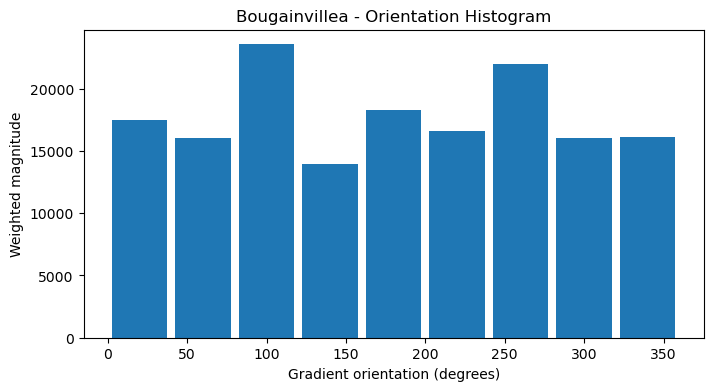

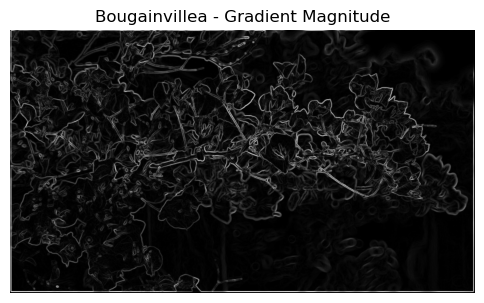

In [6]:
g = gray.astype(np.float32) / 255.0

# Calculate gradients
Gx = cv2.Sobel(g, cv2.CV_32F, 1, 0, ksize=3)
Gy = cv2.Sobel(g, cv2.CV_32F, 0, 1, ksize=3)

# Gradient magnitude and orientation
mag, ang = cv2.cartToPolar(Gx, Gy, angleInDegrees=True)

# Orientation histogram
hist, bins = np.histogram(
    ang,
    bins=9,
    range=(0, 360),
    weights=mag
)

# Orientation histogram
plt.figure(figsize=(8, 4))
plt.bar(
    (bins[:-1] + bins[1:]) / 2,
    hist,
    width=35
)
plt.xlabel('Gradient orientation (degrees)')
plt.ylabel('Weighted magnitude')
plt.title('Bougainvillea - Orientation Histogram')
plt.show()

# Normalize gradient magnitude for display
mag_display = cv2.normalize(
    mag,
    None,
    0,
    255,
    cv2.NORM_MINMAX
).astype(np.uint8)

# Display gradient magnitude
plt.figure(figsize=(6, 6))
plt.imshow(mag_display, cmap='gray')
plt.title('Bougainvillea - Gradient Magnitude')
plt.axis('off')
plt.show()

SIFT keypoints: 300
Descriptor shape: (300, 128)


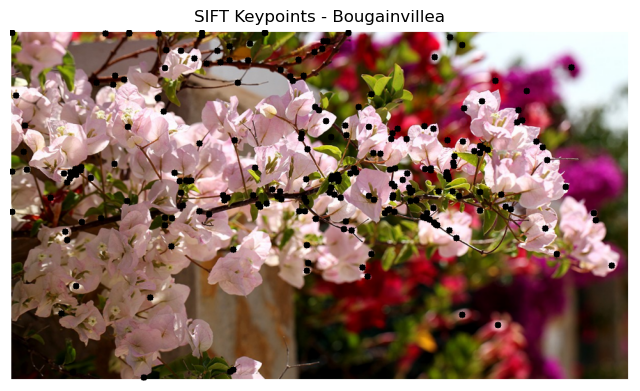

In [8]:
# SIFT feature detection - clearer keypoints

if hasattr(cv2, 'SIFT_create'):

    sift = cv2.SIFT_create(nfeatures=300)

    keypoints, descriptors = sift.detectAndCompute(gray, None)

    # Copy your original image
    sift_img = img_rgb.copy()

    # Draw dark, clearly visible circles
    for kp in keypoints:
        x, y = map(int, kp.pt)

        cv2.circle(
            sift_img,
            (x, y),
            5,              # circle size
            (0, 0, 0),      # black
            -1              # filled circle
        )

    print('SIFT keypoints:', len(keypoints))
    print('Descriptor shape:',
          None if descriptors is None else descriptors.shape)

    # Display
    plt.figure(figsize=(8, 6))
    plt.imshow(sift_img)
    plt.title('SIFT Keypoints - Bougainvillea')
    plt.axis('off')
    plt.show()

else:
    print('SIFT is unavailable in this OpenCV build.')

In [9]:
try:
    surf = cv2.xfeatures2d.SURF_create(hessianThreshold=400)
    surf_kp, surf_des = surf.detectAndCompute(gray, None)
    print('SURF keypoints:', len(surf_kp))
    print('SURF descriptor shape:', None if surf_des is None else surf_des.shape)
except (AttributeError, cv2.error) as e:
    print('SURF is unavailable in this OpenCV build. Use SIFT for the lab.')

SURF is unavailable in this OpenCV build. Use SIFT for the lab.


In [12]:
from skimage.feature import hog

print("HOG is ready!")

HOG is ready!


HOG feature-vector length: 70092


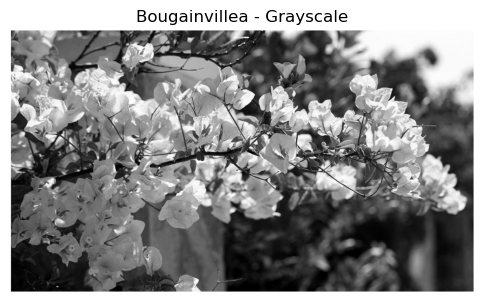

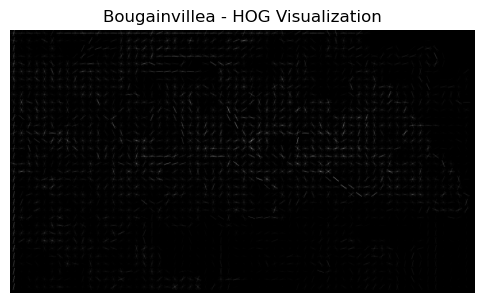

In [13]:
# HOG feature extraction

hog_features, hog_visual = hog(
    gray,
    orientations=9,
    pixels_per_cell=(16, 16),
    cells_per_block=(2, 2),
    visualize=True,
    feature_vector=True
)

print("HOG feature-vector length:", len(hog_features))

# Grayscale image
plt.figure(figsize=(6, 6))
plt.imshow(gray, cmap='gray')
plt.title('Bougainvillea - Grayscale')
plt.axis('off')
plt.show()

# HOG visualization
plt.figure(figsize=(6, 6))
plt.imshow(hog_visual, cmap='gray')
plt.title('Bougainvillea - HOG Visualization')
plt.axis('off')
plt.show()

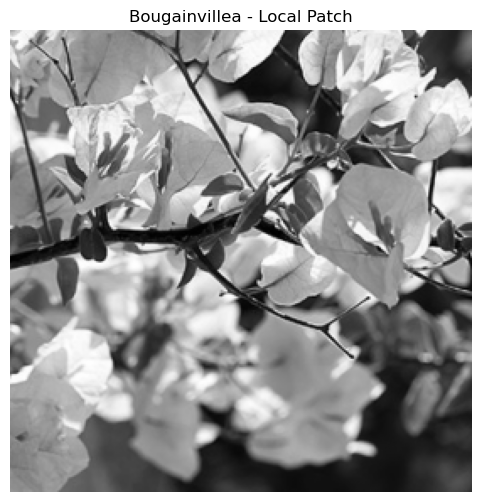

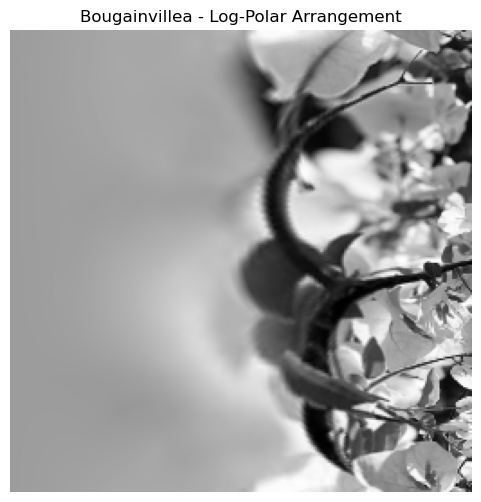

In [14]:
# Log-polar transformation for Bougainvillea image

h, w = gray.shape

# Take a square patch from the center of the image
size = min(h, w) // 2

x0 = w // 2 - size // 2
y0 = h // 2 - size // 2

patch = gray[y0:y0 + size, x0:x0 + size]

# Center of the selected patch
center = (patch.shape[1] / 2, patch.shape[0] / 2)

# Maximum radius
max_radius = min(center)

# Apply log-polar transformation
logpolar = cv2.warpPolar(
    patch,
    (256, 256),
    center,
    max_radius,
    cv2.WARP_POLAR_LOG + cv2.INTER_LINEAR
)

# Display local patch
plt.figure(figsize=(6, 6))
plt.imshow(patch, cmap='gray')
plt.title('Bougainvillea - Local Patch')
plt.axis('off')
plt.show()

# Display log-polar arrangement
plt.figure(figsize=(6, 6))
plt.imshow(logpolar, cmap='gray')
plt.title('Bougainvillea - Log-Polar Arrangement')
plt.axis('off')
plt.show()

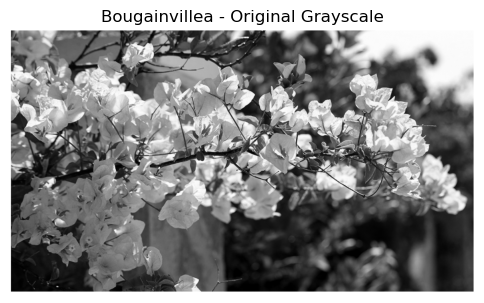

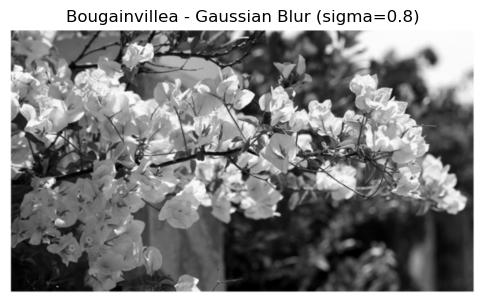

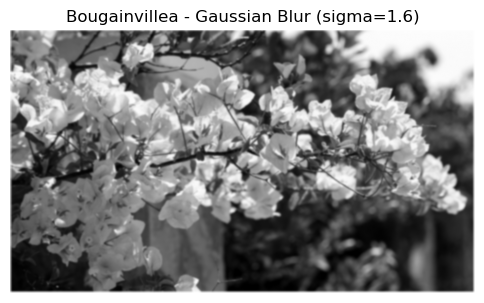

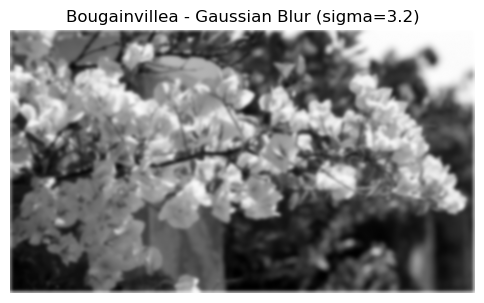

In [15]:
# Multi-scale Gaussian smoothing

sigmas = [0.8, 1.6, 3.2]

scale_imgs = [
    cv2.GaussianBlur(gray, (0, 0), s)
    for s in sigmas
]

# Display original image
plt.figure(figsize=(6, 6))
plt.imshow(gray, cmap='gray')
plt.title('Bougainvillea - Original Grayscale')
plt.axis('off')
plt.show()

# Display different scales
for s, img in zip(sigmas, scale_imgs):
    plt.figure(figsize=(6, 6))
    plt.imshow(img, cmap='gray')
    plt.title(f'Bougainvillea - Gaussian Blur (sigma={s})')
    plt.axis('off')
    plt.show()

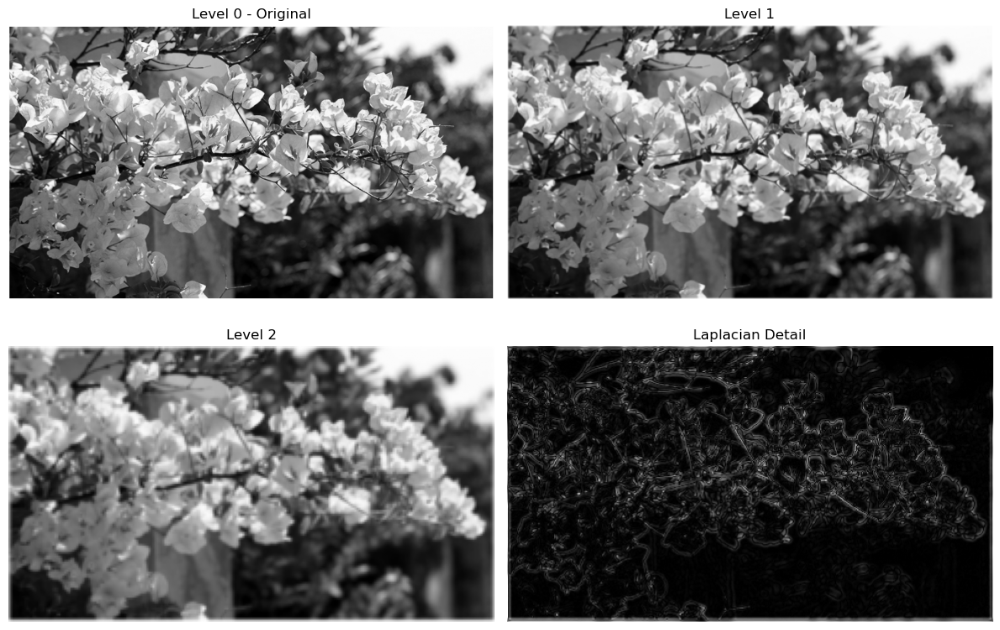

Shapes:
Level 0: (549, 970)
Level 1: (275, 485)
Level 2: (138, 243)
Laplacian detail: (275, 485)


In [16]:
# Laplacian Pyramid

g0 = gray
g1 = cv2.pyrDown(g0)
g2 = cv2.pyrDown(g1)

# Upsample Level 2 back to Level 1 size
up = cv2.pyrUp(
    g2,
    dstsize=(g1.shape[1], g1.shape[0])
)

# Extract the detail lost during downsampling
laplacian_detail = cv2.absdiff(g1, up)

# Display all levels
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.imshow(g0, cmap='gray')
plt.title('Level 0 - Original')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(g1, cmap='gray')
plt.title('Level 1')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(g2, cmap='gray')
plt.title('Level 2')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(laplacian_detail, cmap='gray')
plt.title('Laplacian Detail')
plt.axis('off')

plt.tight_layout()
plt.show()

print('Shapes:')
print('Level 0:', g0.shape)
print('Level 1:', g1.shape)
print('Level 2:', g2.shape)
print('Laplacian detail:', laplacian_detail.shape)

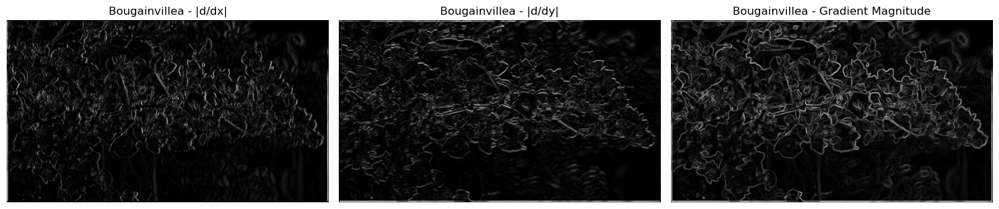

In [17]:
# Sobel Gradient Components

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Smooth the image first to reduce noise
blur = cv2.GaussianBlur(gray, (5, 5), 1.0)

# Horizontal gradient
gx = cv2.Sobel(blur, cv2.CV_32F, 1, 0, ksize=3)

# Vertical gradient
gy = cv2.Sobel(blur, cv2.CV_32F, 0, 1, ksize=3)

# Gradient magnitude
gmag = cv2.magnitude(gx, gy)

# Convert results to displayable 8-bit images
gx_display = cv2.normalize(np.abs(gx), None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
gy_display = cv2.normalize(np.abs(gy), None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
gmag_display = cv2.normalize(gmag, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# Display
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(gx_display, cmap='gray')
plt.title('Bougainvillea - |d/dx|')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(gy_display, cmap='gray')
plt.title('Bougainvillea - |d/dy|')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(gmag_display, cmap='gray')
plt.title('Bougainvillea - Gradient Magnitude')
plt.axis('off')

plt.tight_layout()
plt.show()

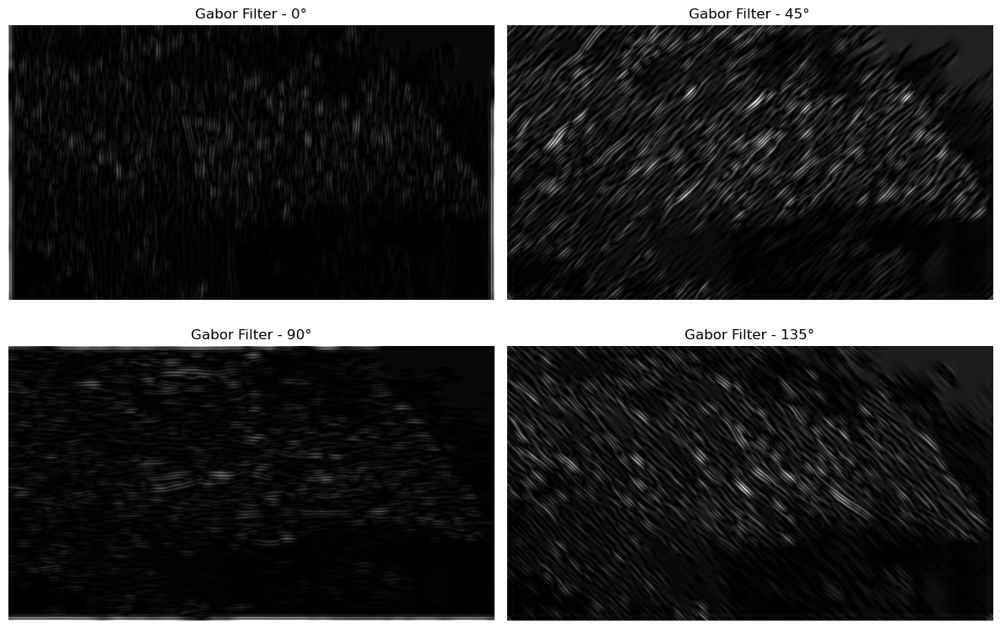

In [18]:
# Gabor Filter at Different Orientations

import cv2
import numpy as np
import matplotlib.pyplot as plt

orientations = [0, 45, 90, 135]
responses = []

for deg in orientations:
    theta = np.deg2rad(deg)

    kernel = cv2.getGaborKernel(
        (31, 31),
        5.0,
        theta,
        10.0,
        0.5,
        0,
        ktype=cv2.CV_32F
    )

    resp = cv2.filter2D(gray, cv2.CV_32F, kernel)

    # Normalize for display
    resp_display = cv2.normalize(
        np.abs(resp),
        None,
        0,
        255,
        cv2.NORM_MINMAX
    ).astype(np.uint8)

    responses.append(resp_display)

# Display results
plt.figure(figsize=(12, 8))

for i, (deg, response) in enumerate(zip(orientations, responses), 1):
    plt.subplot(2, 2, i)
    plt.imshow(response, cmap='gray')
    plt.title(f'Gabor Filter - {deg}°')
    plt.axis('off')

plt.tight_layout()
plt.show()

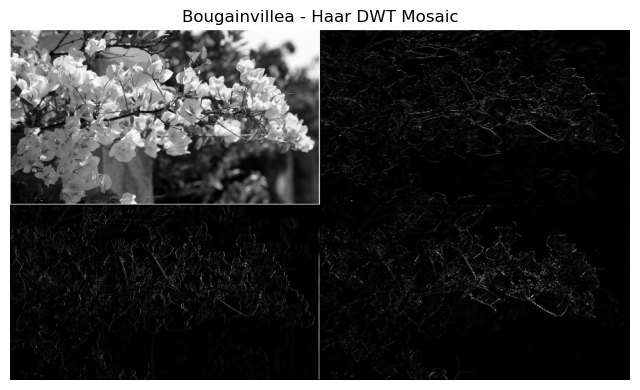

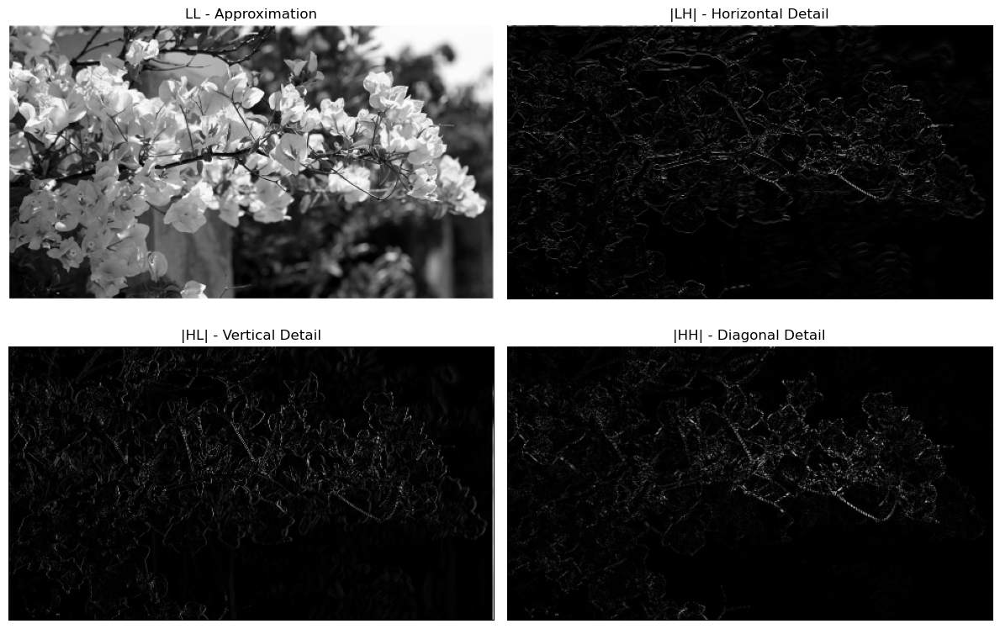

Original gray shape: (549, 970)
Used shape: (548, 970)
LL: (274, 485)
LH: (274, 485)
HL: (274, 485)
HH: (274, 485)


In [20]:
# Haar Discrete Wavelet Transform

import numpy as np
import matplotlib.pyplot as plt
import cv2

x = gray.astype(np.float32)

# Make rows and columns even
h, w = x.shape
h = h - (h % 2)
w = w - (w % 2)

x = x[:h, :w]

# Step 1: Pairwise operations along columns
low_r = (x[:, 0::2] + x[:, 1::2]) / 2
high_r = (x[:, 0::2] - x[:, 1::2]) / 2

# Step 2: Pairwise operations along rows
LL = (low_r[0::2] + low_r[1::2]) / 2
LH = (low_r[0::2] - low_r[1::2]) / 2
HL = (high_r[0::2] + high_r[1::2]) / 2
HH = (high_r[0::2] - high_r[1::2]) / 2

# Normalize for display
def normalize_u8(img):
    img = np.abs(img)
    return cv2.normalize(
        img, None, 0, 255, cv2.NORM_MINMAX
    ).astype(np.uint8)

LL_display = normalize_u8(LL)
LH_display = normalize_u8(LH)
HL_display = normalize_u8(HL)
HH_display = normalize_u8(HH)

# Create Haar DWT mosaic
mosaic = np.block([
    [LL_display, LH_display],
    [HL_display, HH_display]
])

# Display mosaic
plt.figure(figsize=(8, 8))
plt.imshow(mosaic, cmap='gray')
plt.title('Bougainvillea - Haar DWT Mosaic')
plt.axis('off')
plt.show()

# Display individual components
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.imshow(LL_display, cmap='gray')
plt.title('LL - Approximation')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(LH_display, cmap='gray')
plt.title('|LH| - Horizontal Detail')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(HL_display, cmap='gray')
plt.title('|HL| - Vertical Detail')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(HH_display, cmap='gray')
plt.title('|HH| - Diagonal Detail')
plt.axis('off')

plt.tight_layout()
plt.show()

print("Original gray shape:", gray.shape)
print("Used shape:", x.shape)
print("LL:", LL.shape)
print("LH:", LH.shape)
print("HL:", HL.shape)
print("HH:", HH.shape)

Otsu threshold: 124.0


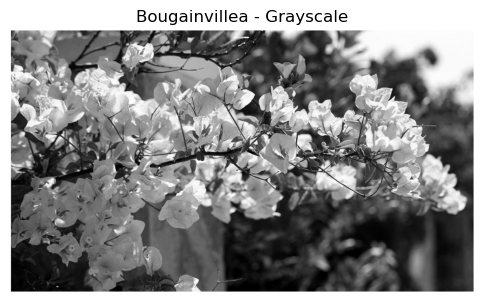

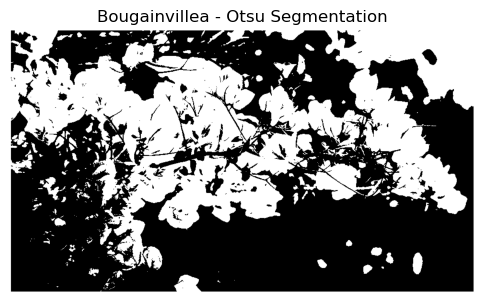

In [21]:
# Otsu Thresholding

import cv2
import matplotlib.pyplot as plt

# Apply Otsu's automatic thresholding
otsu_value, mask_otsu = cv2.threshold(
    gray,
    0,
    255,
    cv2.THRESH_BINARY + cv2.THRESH_OTSU
)

print("Otsu threshold:", otsu_value)

# Display grayscale image
plt.figure(figsize=(6, 6))
plt.imshow(gray, cmap='gray')
plt.title('Bougainvillea - Grayscale')
plt.axis('off')
plt.show()

# Display Otsu segmentation
plt.figure(figsize=(6, 6))
plt.imshow(mask_otsu, cmap='gray')
plt.title("Bougainvillea - Otsu Segmentation")
plt.axis('off')
plt.show()

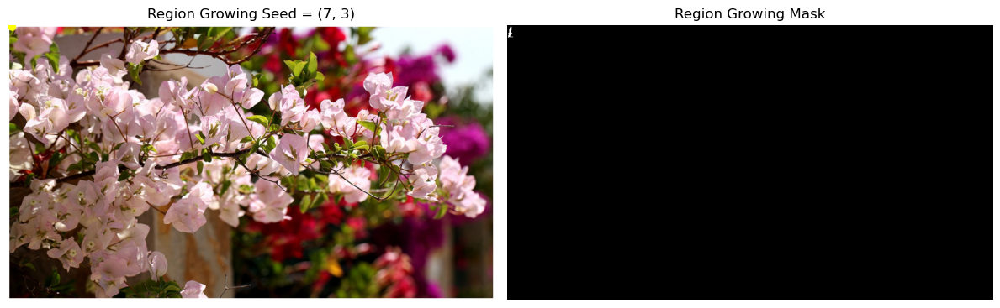

Seed coordinates (x, y): (7, 3)
Seed grayscale value: 85
Threshold: 25


In [22]:
# Region Growing Segmentation

import cv2
import numpy as np
import matplotlib.pyplot as plt

def region_growing(image, seed, threshold=25):
    h, w = image.shape

    result = np.zeros_like(image, dtype=np.uint8)
    visited = np.zeros_like(image, dtype=bool)

    stack = [seed]

    # Intensity value of the starting pixel
    seed_value = int(image[seed[1], seed[0]])

    while stack:
        x, y = stack.pop()

        # Check image boundaries and whether pixel was already visited
        if not (0 <= x < w and 0 <= y < h) or visited[y, x]:
            continue

        visited[y, x] = True

        # Add pixel if its intensity is close to the seed intensity
        if abs(int(image[y, x]) - seed_value) <= threshold:
            result[y, x] = 255

            # 4-connected neighbours
            stack.extend([
                (x + 1, y),
                (x - 1, y),
                (x, y + 1),
                (x, y - 1)
            ])

    return result


# Automatically select a highly saturated pixel as the seed
hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)

sy, sx = np.unravel_index(
    np.argmax(hsv[:, :, 1]),
    hsv[:, :, 1].shape
)

seed = (int(sx), int(sy))

# Apply region growing
mask_rg = region_growing(gray, seed, threshold=25)

# Mark the seed point on the original image
seed_img = img_rgb.copy()
cv2.circle(seed_img, seed, 8, (255, 255, 0), -1)

# Display results
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(seed_img)
plt.title(f'Region Growing Seed = {seed}')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(mask_rg, cmap='gray')
plt.title('Region Growing Mask')
plt.axis('off')

plt.tight_layout()
plt.show()

print("Seed coordinates (x, y):", seed)
print("Seed grayscale value:", int(gray[seed[1], seed[0]]))
print("Threshold:", 25)

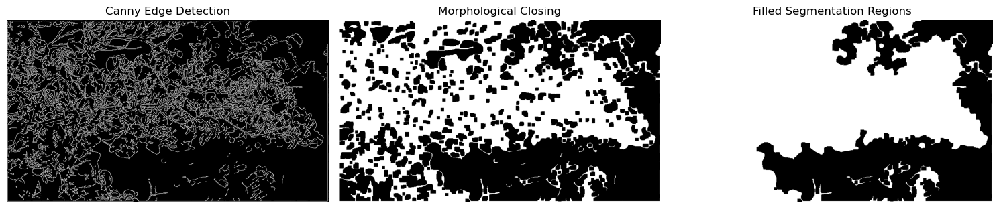

Total contours detected: 18
Contours filled: 6


In [23]:
# Edge-Based Segmentation using Canny and Contours

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Detect edges using Canny
edges_seg = cv2.Canny(gray, 45, 100)

# Step 2: Create morphological kernel
kernel = np.ones((5, 5), np.uint8)

# Step 3: Close small gaps in the detected edges
closed = cv2.morphologyEx(
    edges_seg,
    cv2.MORPH_CLOSE,
    kernel,
    iterations=2
)

# Step 4: Find external contours
contours, _ = cv2.findContours(
    closed,
    cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_SIMPLE
)

# Step 5: Create an empty segmentation mask
mask_edge = np.zeros_like(gray)

# Ignore very small contours caused by texture/noise
valid = [
    c for c in contours
    if cv2.contourArea(c) > 100
]

# Fill the valid contour regions
cv2.drawContours(
    mask_edge,
    valid,
    -1,
    255,
    thickness=cv2.FILLED
)

# Display results
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(edges_seg, cmap='gray')
plt.title('Canny Edge Detection')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(closed, cmap='gray')
plt.title('Morphological Closing')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(mask_edge, cmap='gray')
plt.title('Filled Segmentation Regions')
plt.axis('off')

plt.tight_layout()
plt.show()

print("Total contours detected:", len(contours))
print("Contours filled:", len(valid))

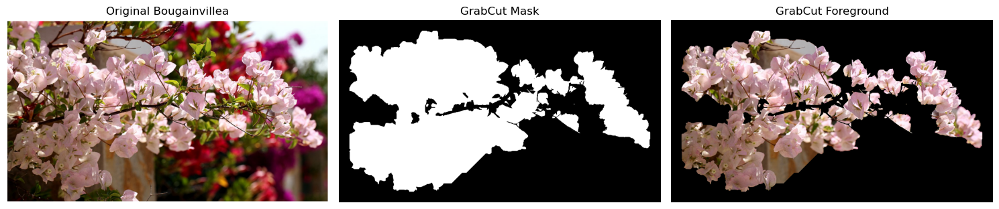

Image shape: (549, 970, 3)
Rectangle used: (32, 32, 906, 485)


In [25]:
# GrabCut Segmentation

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Create GrabCut mask
mask_gc = np.zeros(gray.shape, np.uint8)

# Background and foreground models
bgd = np.zeros((1, 65), np.float64)
fgd = np.zeros((1, 65), np.float64)

h, w = gray.shape

# Define a rectangle slightly inside the image
margin = int(0.06 * min(h, w))

rect = (
    margin,
    margin,
    w - 2 * margin,
    h - 2 * margin
)

# Apply GrabCut
cv2.grabCut(
    img_bgr,
    mask_gc,
    rect,
    bgd,
    fgd,
    5,
    cv2.GC_INIT_WITH_RECT
)

# Keep foreground pixels
fg = np.where(
    (mask_gc == 2) | (mask_gc == 0),
    0,
    1
).astype('uint8')

# Apply mask to original image
grabcut_rgb = img_rgb * fg[:, :, None]

# Display results
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(img_rgb)
plt.title('Original Bougainvillea')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(fg * 255, cmap='gray')
plt.title('GrabCut Mask')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(grabcut_rgb)
plt.title('GrabCut Foreground')
plt.axis('off')

plt.tight_layout()
plt.show()

print("Image shape:", img_rgb.shape)
print("Rectangle used:", rect)

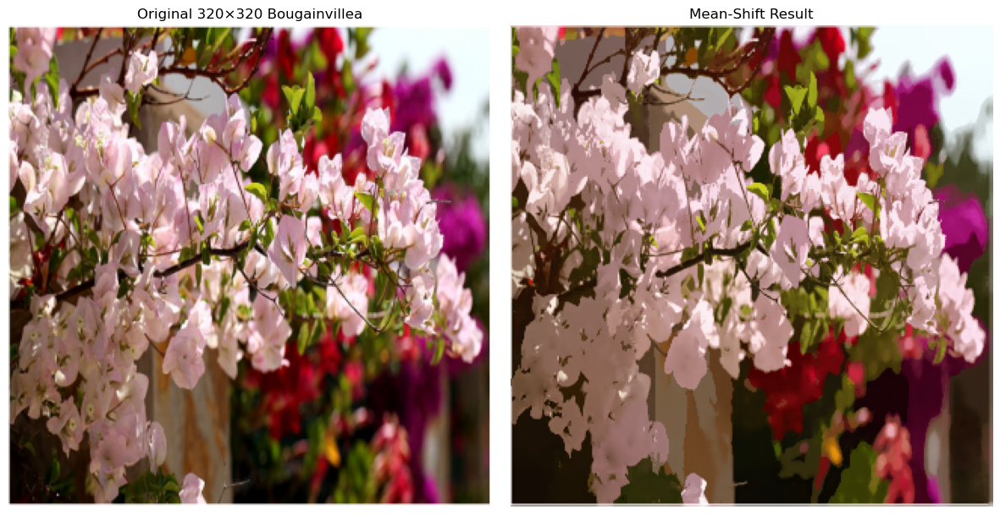

In [26]:
# Mean-Shift Filtering

import cv2
import matplotlib.pyplot as plt

# Resize image for faster processing
small_bgr = cv2.resize(
    img_bgr,
    (320, 320),
    interpolation=cv2.INTER_AREA
)

# Apply Mean-Shift filtering
ms = cv2.pyrMeanShiftFiltering(
    small_bgr,
    sp=16,
    sr=28
)

# Convert BGR to RGB for displaying with Matplotlib
small_rgb = cv2.cvtColor(
    small_bgr,
    cv2.COLOR_BGR2RGB
)

ms_rgb = cv2.cvtColor(
    ms,
    cv2.COLOR_BGR2RGB
)

# Display results
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(small_rgb)
plt.title('Original 320×320 Bougainvillea')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(ms_rgb)
plt.title('Mean-Shift Result')
plt.axis('off')

plt.tight_layout()
plt.show()

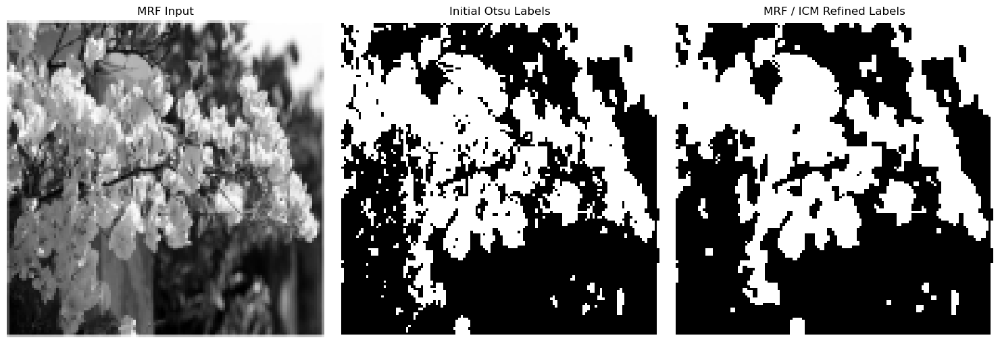

MRF input shape: (128, 128)
Initial class means: [64.7151804670913, 178.21338311315336]
Beta: 5.0
Iterations: 3


In [27]:
# MRF / ICM Image Segmentation

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Resize for faster processing
gray_mrf = cv2.resize(
    gray,
    (128, 128),
    interpolation=cv2.INTER_AREA
)

# Initial segmentation using Otsu thresholding
_, init_mask = cv2.threshold(
    gray_mrf,
    0,
    1,
    cv2.THRESH_BINARY + cv2.THRESH_OTSU
)

labels = init_mask.astype(np.uint8)

# Calculate mean intensity for each class
means = [
    float(gray_mrf[labels == c].mean())
    if np.any(labels == c)
    else float(gray_mrf.mean())
    for c in [0, 1]
]

# MRF parameters
beta = 5.0
sigma2 = max(float(gray_mrf.var()), 1.0)

# ICM refinement
for _ in range(3):

    new_labels = labels.copy()

    for y in range(1, 127):
        for x in range(1, 127):

            # 4-connected neighbours
            neigh = [
                labels[y-1, x],
                labels[y+1, x],
                labels[y, x-1],
                labels[y, x+1]
            ]

            costs = []
            val = float(gray_mrf[y, x])

            for cls in [0, 1]:

                # Data cost
                data_cost = (val - means[cls]) ** 2 / sigma2

                # Smoothness cost
                smooth_cost = beta * sum(
                    cls != n for n in neigh
                )

                # Total cost
                costs.append(data_cost + smooth_cost)

            # Select class with minimum cost
            new_labels[y, x] = int(np.argmin(costs))

    labels = new_labels

# Display results
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(gray_mrf, cmap='gray')
plt.title('MRF Input')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(init_mask * 255, cmap='gray')
plt.title('Initial Otsu Labels')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(labels * 255, cmap='gray')
plt.title('MRF / ICM Refined Labels')
plt.axis('off')

plt.tight_layout()
plt.show()

print("MRF input shape:", gray_mrf.shape)
print("Initial class means:", means)
print("Beta:", beta)
print("Iterations:", 3)

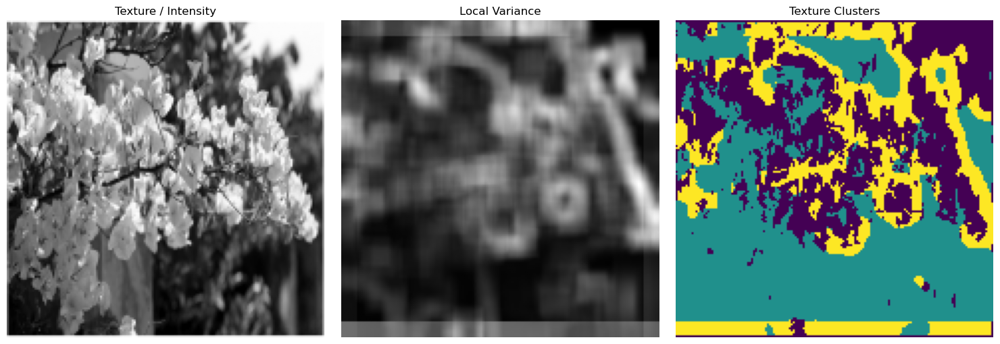

Texture shape: (160, 160)
Feature matrix shape: (25600, 2)
Number of clusters: 3


In [30]:
# Texture Segmentation using Local Variance and K-Means

import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Resize image for faster processing
texture = cv2.resize(
    gray,
    (160, 160),
    interpolation=cv2.INTER_AREA
).astype(np.float32)

# Calculate local mean
mean = cv2.blur(
    texture,
    (15, 15)
)

# Calculate local mean of squared values
mean2 = cv2.blur(
    texture ** 2,
    (15, 15)
)

# Calculate local variance
variance = np.maximum(
    mean2 - mean ** 2,
    0
)

# Standardise intensity feature
f1 = (
    texture - texture.mean()
) / (
    texture.std() + 1e-6
)

# Standardise variance feature
f2 = (
    variance - variance.mean()
) / (
    variance.std() + 1e-6
)

# Create feature matrix
features_tex = np.column_stack([
    f1.ravel(),
    f2.ravel()
])

# K-Means clustering
labels_tex = KMeans(
    n_clusters=3,
    random_state=0,
    n_init=10
).fit_predict(
    features_tex
).reshape(
    texture.shape
)

# Display results
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(texture, cmap='gray')
plt.title('Texture / Intensity')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(variance, cmap='gray')
plt.title('Local Variance')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(labels_tex, cmap='viridis')
plt.title('Texture Clusters')
plt.axis('off')

plt.tight_layout()
plt.show()

print("Texture shape:", texture.shape)
print("Feature matrix shape:", features_tex.shape)
print("Number of clusters:", 3)

Localised candidate regions: 1


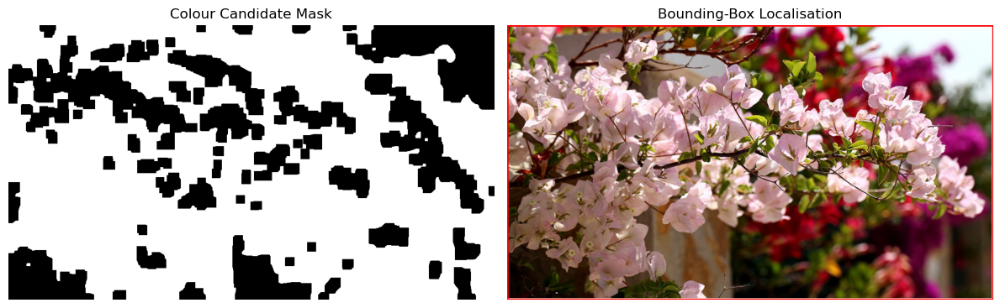

In [31]:
# Colour-Based Segmentation and Bounding-Box Localisation

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Convert RGB image to HSV
hsv = cv2.cvtColor(
    img_rgb,
    cv2.COLOR_RGB2HSV
)

# Select vivid/colorful regions
mask_color = cv2.inRange(
    hsv,
    np.array([0, 70, 40], np.uint8),
    np.array([179, 255, 255], np.uint8)
)

# Remove small noise
mask_color = cv2.morphologyEx(
    mask_color,
    cv2.MORPH_OPEN,
    np.ones((5, 5), np.uint8),
    iterations=1
)

# Fill small gaps and connect nearby regions
mask_color = cv2.morphologyEx(
    mask_color,
    cv2.MORPH_CLOSE,
    np.ones((9, 9), np.uint8),
    iterations=2
)

# Find external contours
contours, _ = cv2.findContours(
    mask_color,
    cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_SIMPLE
)

# Draw bounding boxes
result_det = img_rgb.copy()

boxes = []

for c in contours:

    area = cv2.contourArea(c)

    # Keep only sufficiently large regions
    if area > 0.01 * gray.size:

        x, y, w, h = cv2.boundingRect(c)

        boxes.append(
            (x, y, w, h, area)
        )

        cv2.rectangle(
            result_det,
            (x, y),
            (x + w, y + h),
            (255, 0, 0),
            3
        )

print(
    "Localised candidate regions:",
    len(boxes)
)

# Display results
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(
    mask_color,
    cmap="gray"
)
plt.title("Colour Candidate Mask")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(
    result_det
)
plt.title("Bounding-Box Localisation")
plt.axis("off")

plt.tight_layout()
plt.show()

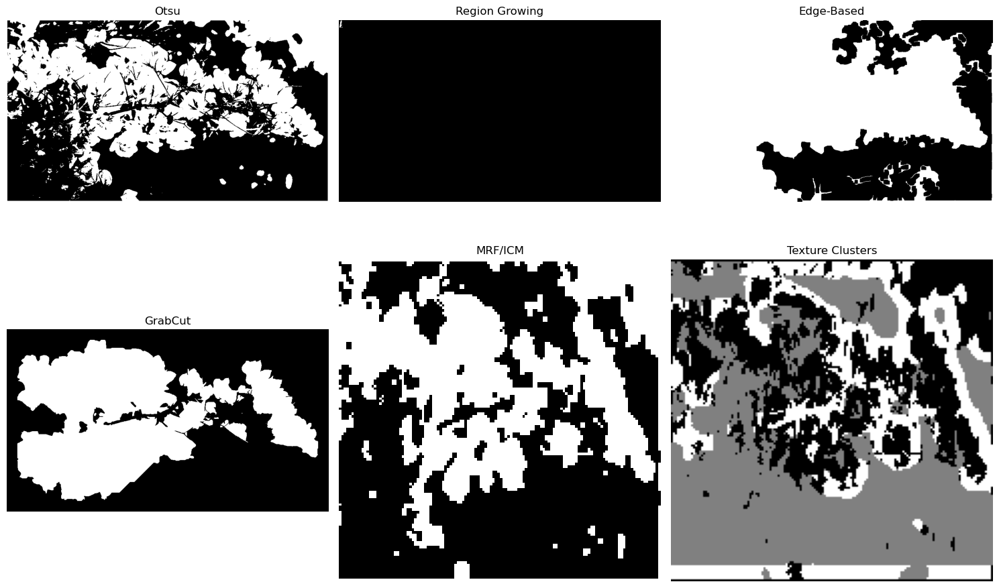

In [33]:
# Compare all segmentation results

images = [
    mask_otsu,
    mask_rg,
    mask_edge,
    fg * 255,
    labels * 255,
    labels_tex
]

titles = [
    'Otsu',
    'Region Growing',
    'Edge-Based',
    'GrabCut',
    'MRF/ICM',
    'Texture Clusters'
]

plt.figure(figsize=(15, 10))

for i, (image, title) in enumerate(
    zip(images, titles),
    1
):
    plt.subplot(2, 3, i)

    if image.ndim == 2:
        plt.imshow(image, cmap='gray')
    else:
        plt.imshow(image)

    plt.title(title)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [35]:
# Final feature extraction summary

print(
    'SIFT descriptor shape:',
    'not available'
    if 'descriptors' not in globals() or descriptors is None
    else descriptors.shape
)

print(
    'HOG feature-vector length:',
    len(hog_features)
)

print(
    'Hessian/DoH interest regions:',
    len(blobs)
)

print(
    'Hough line segments:',
    0
    if 'lines' not in globals() or lines is None
    else len(lines)
)

SIFT descriptor shape: (300, 128)
HOG feature-vector length: 70092
Hessian/DoH interest regions: 248
Hough line segments: 0
